In [1]:
%matplotlib inline
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from colour.notation import HEX_to_RGB
from colour import convert, describe_conversion_path, delta_E
from sklearn.cluster import KMeans

pd.options.display.max_columns = None
pd.options.display.max_rows = None

# set seeds
np.random.seed(1)
random.seed(1)
sns.set(style = 'darkgrid')

# Clean data

In [10]:
df = pd.read_csv('data/train.csv')
y = np.log1p(df['Num of Profile Likes'].values)
X = df.drop(columns='Num of Profile Likes')

## Transform pipeline

In [47]:
from sklearn.base import TransformerMixin
from collections import defaultdict

def create_new_features(X):
    # transform utc offset:
    X['Sin_UTC'] = np.sin((11 * 3600 + X['UTC Offset']) / (24 * 3600) * 2 * np.pi)
    X['Cos_UTC'] = np.cos((11 * 3600 + X['UTC Offset']) / (24 * 3600) * 2 * np.pi)
    
    # time since creation in days
    duration = (pd.to_datetime('today') - 
                pd.to_datetime(X['Profile Creation Timestamp']).dt.tz_localize(None))
    X['Duration'] = duration.apply(lambda x: x.days)
    
    # convert personal url into True/False (NaNs or unique)
    X['Has Personal URL'] = X['Personal URL'].notna()
    
    # log(x + 1) of numerical features
    for feature in ['Num of Followers', 'Num of People Following',
                    'Num of Status Updates', 'Num of Direct Messages',
                    'Avg Daily Profile Visit Duration in seconds',
                    'Avg Daily Profile Clicks']:
        X[f'log {feature}'] = np.log1p(X[feature])

    for col in ['Profile Text Color', 'Profile Page Color', 'Profile Theme Color']:
        X[f'Lab {col}'] = X[col].apply(lambda x: convert(HEX_to_RGB(x), 'RGB', 'CIE Lab') if not pd.isnull(x) 
                else convert((1,1,1), 'RGB', 'CIE Lab'))
    return X
    
def clean_features(X):
    # merge categories names with and without cap letter
    X['Location Public Visibility'] = X['Location Public Visibility'].str.lower()
    return X

def drop_features(X, l_features):
    return X.drop(columns=l_features)
    
class RemoveCategories(TransformerMixin):
    def __init__(self, min_obs=10, l_cols=[]):
        self.min_obs = min_obs
        self.l_cats = {}
        self.l_cols = l_cols

    def set_params(self, **params):
        if not params:
            # Simple optimization to gain speed (inspect is slow)
            return self
        valid_params = {'min_obs':'min_obs'}
        setattr(self, 'min_obs', params['min_obs'])
       
        return self


    def fit(self, X, y=None, **fit_params):
        # assumes all columns of df_cat are strings
        print("remove")
        for col in self.l_cols:
            val_counts = X[col].fillna('missing').value_counts()
            self.l_cats[col] = val_counts[val_counts >= self.min_obs].index.tolist()
        return self

    def transform(self, X):
        # assumes X is a DataFrame
        for col in self.l_cols:
            X.loc[~ X[col].isin(self.l_cats[col]), col] = 'other'        
        return X

class ClusterColors(TransformerMixin):
    """ The data in X[ccols] should be CIE Lab color data"""
    def __init__(self, ccols=['Lab Profile Text Color', 'Lab Profile Page Color', 'Lab Profile Theme Color'], *args, **kwargs):
        self.clusterers = dict(zip(ccols, [KMeans(*args, **kwargs)]*len(ccols)))
        self.columns = ccols

    def set_params(self, **params):
        for clusterer in self.clusterers.values():
            clusterer.set_params(**params)
        return self

    def fit(self, X, y=None, **fit_params):        
        for col in self.columns:
            self.clusterers[col].fit(list(X[col].to_numpy()))
        return self

    def transform(self, X):
        for col in self.columns:
            X[f'Clustered {col}'] = self.clusterers[col].predict(list(X[col].to_numpy()))
        return X


In [12]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer

ccols = ['Profile Text Color', 'Profile Page Color',
               'Profile Theme Color']
clab = ['Lab '+cc for cc in ccols]
l_cat_small = ['User Language', 'Location']


features_to_drop =dict(l_features = ['Id', 'User Name', 'Profile Image',
                                     'Personal URL', 'UTC Offset', 
                                     'Profile Creation Timestamp',
                                     'User Time Zone']+ccols)
static_pipe = Pipeline([
    ('create new features', FunctionTransformer(create_new_features)),
    ('clean data', FunctionTransformer(clean_features)),
    ('drop variables', FunctionTransformer(drop_features, kw_args=features_to_drop)),
])

X = static_pipe.fit_transform(X)

In [39]:
def plot_clusters(points, cluster_centers, cp, sub):
    fig = plt.figure()
    ax = fig.add_subplot(sub, projection = '3d')

    x, y, z = zip(*points)

    ax.set_xlabel("L")
    ax.set_ylabel("A")
    ax.set_zlabel("B")

    ax.scatter(x, y, z, color=cp)



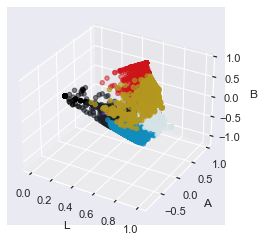

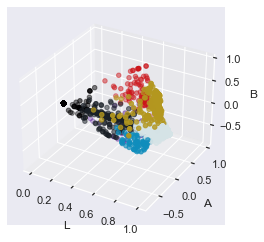

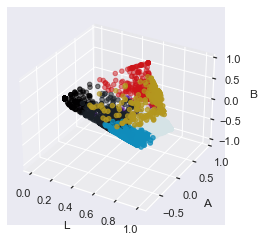

In [45]:
ccols=['Lab Profile Text Color', 'Lab Profile Page Color', 'Lab Profile Theme Color']
km = KMeans(n_clusters=7, n_init=10, max_iter=300, tol=1e-4)
cp = sns.color_palette()[:7]
km.fit(list(X[ccols].to_numpy().flatten()))
centers = km.cluster_centers_
rgb_centers = convert(centers, 'CIE Lab', 'RGB')
for sub, col in zip([111,111,111,], ccols):
    clusters = km.predict(list(X[col].to_numpy()))
    ccolors = [rgb_centers[cl] for cl in clusters]
    plot_clusters(X[col].to_numpy(), centers, ccolors, sub)

plt.show()

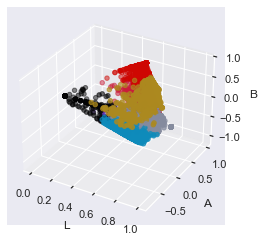

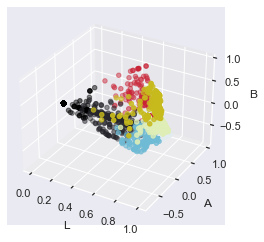

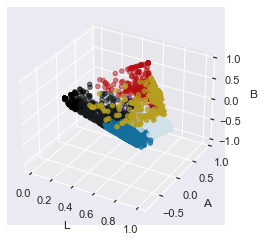

In [46]:
ccols=['Lab Profile Text Color', 'Lab Profile Page Color', 'Lab Profile Theme Color']
km = KMeans(n_clusters=7, n_init=10, max_iter=300, tol=1e-4)
for sub, col in zip([111,111,111,], ccols):
    km.fit(list(X[col].to_numpy()))
    centers = km.cluster_centers_
    rgb_centers = convert(centers, 'CIE Lab', 'RGB')
    clusters = km.predict(list(X[col].to_numpy()))
    ccolors = [rgb_centers[cl] for cl in clusters]
    plot_clusters(X[col].to_numpy(), centers, ccolors, sub)

plt.show()

## Imputation and encoding/scaling

### Functions to get dataframe back

In [5]:
from sklearn.feature_extraction.text import _VectorizerMixin
from sklearn.feature_selection._base import SelectorMixin

def get_feature_out(estimator, feature_in):
    if hasattr(estimator,'get_feature_names'):
        if isinstance(estimator, _VectorizerMixin):
            # handling all vectorizers
            return [f'vec_{f}' \
                for f in estimator.get_feature_names()]
        else:
            return estimator.get_feature_names(feature_in)
    elif isinstance(estimator, SelectorMixin):
        return np.array(feature_in)[estimator.get_support()]
    else:
        return feature_in


def get_ct_feature_names(ct):
    # handles all estimators, pipelines inside ColumnTransfomer
    # doesn't work when remainder =='passthrough'
    # which requires the input column names.
    output_features = []

    for name, estimator, features in ct.transformers_:
        if name!='remainder':
            if isinstance(estimator, Pipeline):
                current_features = features
                for step in estimator:
                    current_features = get_feature_out(step, current_features)
                features_out = current_features
            else:
                features_out = get_feature_out(estimator, features)
            output_features.extend(features_out)
        elif estimator=='passthrough':
            output_features.extend(ct._feature_names_in[features])
                
    return output_features

In [6]:
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

# numerical features
ccols = ['Lab Profile Text Color', 'Lab Profile Page Color',
               'Lab Profile Theme Color',]
num_features = list(X.select_dtypes(exclude=['object', 'bool']).columns)
# num_features.append(pd.Index(ccols))
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
    ])

catcols = list(X.select_dtypes(include=['object', 'bool']).columns) + ['Clustered '+c for c in ccols]
print(catcols)
cat_features = list([col for col in catcols if col not in ccols])

# categorical features
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(sparse=False))])

# preprocessing
preprocessor = ColumnTransformer(
    transformers=[('num', numeric_transformer, num_features),
                  ('cat', categorical_transformer, cat_features)])
# X_t = preprocessor.fit_transform(X)
# X2 = pd.DataFrame(X_t, columns=get_ct_feature_names(preprocessor))

['Profile Cover Image Status', 'Profile Verification Status', 'Is Profile View Size Customized?', 'Location', 'Location Public Visibility', 'User Language', 'Profile Category', 'Has Personal URL', 'Lab Profile Text Color', 'Lab Profile Page Color', 'Lab Profile Theme Color', 'Clustered Lab Profile Text Color', 'Clustered Lab Profile Page Color', 'Clustered Lab Profile Theme Color']


In [7]:


var_pipe = lambda x: Pipeline([
    ('remove', RemoveCategories(min_obs=10, l_cols=l_cat_small)),
    ('cluster', ClusterColors(n_clusters=8, n_init=10, max_iter=300, tol=1e-4)),
    ('preprocess', preprocessor),
    ('model', x)
])

# Linear models

In [8]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge

parameters = {
    'model__alpha': np.logspace(-2, 2, 4),
    'model__normalize':[True, False],
    'model__tol': np.logspace(-6,-2,5),
    'remove__min_obs': (15,),
    'cluster__n_clusters': range(5,10)
    }
ridge_pipe = var_pipe(Ridge())
reg_cv = GridSearchCV(ridge_pipe, param_grid=parameters, scoring='neg_mean_squared_error', n_jobs=-1)
reg_cv.fit(X, y)
print(np.sqrt(-reg_cv.best_score_), reg_cv.best_params_)

remove
Cluster
1.88065458736 {'cluster__n_clusters': 7, 'model__alpha': 0.21544346900318834, 'model__normalize': True, 'model__tol': 0.0001, 'remove__min_obs': 15}


In [28]:
reg = reg_cv.best_estimator_
test = pd.read_csv('data/test.csv')
index = test.Id
temp = static_pipe.transform(test)
Xt = preprocessor.transform(
        temp
        )
ytest = np.expm1(reg.predict(Xt))


ValueError: Found unknown categories [10, 3, 6, 7] in column 7 during transform

In [ ]:
print(len(ytest))
print(len(index))
len(Xt)

In [ ]:
res = pd.DataFrame(pd.Series(ytest, name='Predicted'))
res.set_index(pd.Index(index.values, name="Id"), inplace=True)
res.to_csv('elasticnet.csv')